In [2]:
import sqlite3 as sql

import numpy as np
import pandas as pd
from pandas import cut, read_sql
import pickle as pkl
from random import choices
from sklearn import metrics
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import scipy.optimize as optimize

from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go
from matplotlib.colors import LogNorm, Normalize

from standard_plotting import set_size
tex_fonts = {
    # Use LaTeX to write all text
    "text.usetex": False,
    # Use 10pt font in plots, to match 10pt font in document
    "axes.labelsize": 11,
    "font.size": 11,
    # Make the legend/label fonts a little smaller
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9
}

plt.rcParams.update(tex_fonts)

In [3]:
dom_info = pd.read_csv('dom_info.csv')

In [4]:
print(dom_info.columns)

Index(['string', 'dom_number', 'pmt_number', 'dom_x', 'dom_y', 'dom_z',
       'dom_time', 'dom_type', 'width', 'rde', 'pmt_area', 'pmt_dir_x',
       'pmt_dir_y', 'pmt_dir_z'],
      dtype='object')


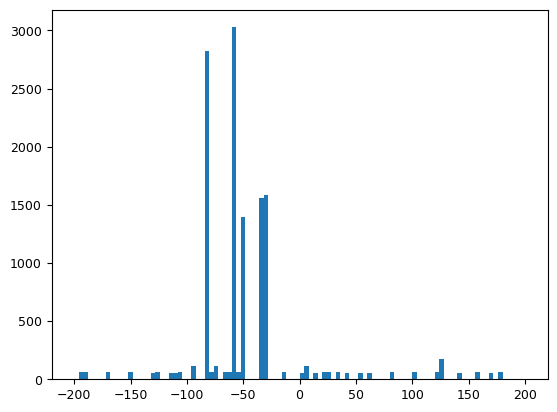

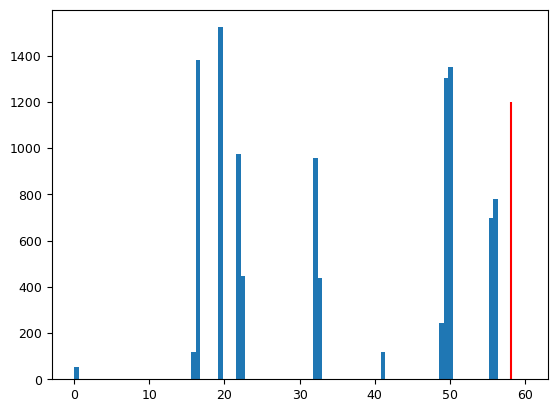

In [7]:
MC_db_path = "/groups/icecube/petersen/GraphNetDatabaseRepository/osc_next_database_new_muons_peter/Merged_db/osc_next_level3_v2.00_genie_muongun_noise_120000_140000_160000_139008_888003_retro.db"
RD_db_path = "/groups/icecube/petersen/GraphNetDatabaseRepository/dev_lvl3_genie_burnsample/dev_lvl3_genie_burnsample_v5.db"



In [8]:
def load_Truth_from_sql(event_no,db_path):
    with sql.connect(db_path) as conn:
        data = pd.read_sql_query("""
            SELECT
                *
            FROM 
                Truth
            WHERE
                event_no = """+ str(event_no)+';', conn)
    return data

def load_SplitInIcePulses_from_sql(event_no,db_path):
    with sql.connect(db_path) as conn:
        data = pd.read_sql_query("""
            SELECT
                *
            FROM 
                SplitInIcePulses
            WHERE
                event_no = """+ str(event_no)+';', conn)
    return data

def load_SRTInIcePulses_from_sql(event_no,db_path):
    with sql.connect(db_path) as conn:
        data = pd.read_sql_query("""
            SELECT
                *
            FROM 
                SRTInIcePulses
            WHERE
                event_no = """+ str(event_no)+';', conn)
    return data

In [9]:
# RD_low_energy_tracks = [39497199.0, 74133869.0, 91879623.0, 2283657.0, 88035452.0, 91984192.0, 43136457.0, 27497593.0, 64986084.0, 21132244.0, 70200478.0, 55066778.0, 59423257.0, 89170772.0, 47644764.0, 89687670.0, 60244188.0, 20472998.0, 67930190.0, 97551727.0, 2393414.0, 85482549.0, 43138318.0, 15959544.0, 87416798.0]
# RD_high_energy_tracks = [93047718.0, 73580659.0, 2126858.0, 77212457.0, 27085652.0, 44529367.0, 24089409.0, 1591854.0, 69052670.0, 68606052.0, 3912538.0, 82847481.0, 4297880.0, 3449740.0, 14591434.0, 74984174.0, 52468873.0, 59472650.0, 4796157.0, 6504865.0, 60102152.0, 48494607.0, 79008923.0, 19654877.0, 8126040.0]
# MC_low_energy_tracks = [31934234.0, 3708833.0, 28385463.0, 32696382.0, 1178291.0, 3835984.0, 30963632.0, 36939679.0, 6788576.0, 1728851.0, 17839667.0, 34591408.0, 1376572.0, 12581071.0, 1857446.0, 3712408.0, 17475909.0, 19472255.0, 1259246.0, 29967817.0, 20892531.0, 20965241.0, 11351396.0, 25825938.0, 32977073.0]
# MC_high_energy_tracks = [7921233.0, 9351194.0, 720433.0, 17677120.0, 16256128.0, 23689495.0, 2014237.0, 11363375.0, 26138712.0, 9133801.0, 26300845.0, 26980392.0, 2479434.0, 34839448.0, 2943417.0, 21648046.0, 5289386.0, 25904157.0, 8794877.0, 846984.0, 37657637.0, 31175382.0, 13588617.0, 29498985.0, 17034614.0]
# RD_low_energy_cascades = [65392160.0, 76361124.0, 45426212.0, 25699343.0, 43484487.0, 2406930.0, 75075196.0, 85908673.0, 53000573.0, 17458282.0, 80572604.0, 84682216.0, 23066957.0, 47826225.0, 64648564.0, 19108109.0, 38713651.0, 16640741.0, 27533906.0, 98214870.0, 83524350.0, 27804048.0, 80880083.0, 22118159.0, 68392865.0]
# RD_high_energy_cascades = [63685421.0, 75206583.0, 79326968.0, 48371625.0, 30717329.0, 85712389.0, 5763167.0, 5101072.0, 5753233.0, 72700235.0, 46250906.0, 29662940.0, 19175862.0, 84697608.0, 28110468.0, 69836221.0, 80765040.0, 40325203.0, 89093328.0, 52806016.0, 45299172.0, 69031876.0, 34512681.0, 45944950.0, 63975376.0]
# MC_low_energy_cascades = [9943881.0, 7593751.0, 15667719.0, 4585744.0, 9902187.0, 26977157.0, 30127982.0, 8236370.0, 15678821.0, 3709547.0, 19945628.0, 22243671.0, 510756.0, 4589251.0, 551972.0, 37814880.0, 293789.0, 30605859.0, 7110333.0, 36943835.0, 24331666.0, 37090556.0, 23087585.0, 11803641.0, 35039292.0]
# MC_high_energy_cascades = [8171194.0, 24164773.0, 37396140.0, 21086693.0, 10977248.0, 31877379.0, 215497.0, 20694057.0, 20697048.0, 24752951.0, 2799535.0, 651328.0, 38070882.0, 9170788.0, 17203883.0, 30812862.0, 25465430.0, 10041846.0, 1205452.0, 34918201.0, 9533133.0, 21765059.0, 30576339.0, 26295985.0, 35045912.0]

# MC_cascades_path = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/MC_cascades.csv"
# MC_tracks_path = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/MC_tracks.csv"
# RD_cascades_path = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/RD_cascades.csv"
# RD_tracks_path = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/RD_tracks.csv"

# MC_cascades = pd.read_csv(MC_cascades_path)
# MC_tracks = pd.read_csv(MC_tracks_path)
# RD_cascades = pd.read_csv(RD_cascades_path)
# RD_tracks = pd.read_csv(RD_tracks_path)


# type = 'high'
# if type == 'high':
#     RD_tracks = RD_high_energy_tracks
#     MC_tracks = MC_high_energy_tracks
#     RD_cascades = RD_high_energy_cascades
#     MC_cascades = MC_high_energy_cascades
# else:
#     RD_tracks = RD_low_energy_tracks
#     MC_tracks = MC_low_energy_tracks
#     RD_cascades = RD_low_energy_cascades
#     MC_cascades = MC_low_energy_cascades

# index = 9

In [10]:



# MC_cascades_event_no_by_energy = (MC_cascades.sort_values(by='energy'))['event_no'].tolist()
# #print(len(MC_cascades_event_no_by_energy))
# RD_cascades_event_no_by_energy = (RD_cascades.sort_values(by='energy_pred'))['event_no'].tolist()

# MC_tracks_from_down = MC_tracks[MC_tracks['zenith']>np.pi/2]
# RD_tracks_from_down = RD_tracks[RD_tracks['zenith_pred']>np.pi/2]

# MC_tracks_from_up = MC_tracks[MC_tracks['zenith']<np.pi/2]
# RD_tracks_from_up = RD_tracks[RD_tracks['zenith_pred']<np.pi/2]

# from_down = True
# if from_down:
#     MC_tracks_event_no_by_energy = (MC_tracks_from_down.sort_values(by='energy'))['event_no'].tolist()
#     RD_tracks_event_no_by_energy = (RD_tracks_from_down.sort_values(by='energy_pred'))['event_no'].tolist()
#     MC_tracks_event_no_by_energy_from_up = (MC_tracks_from_up.sort_values(by='energy'))['event_no'].tolist()
#     RD_tracks_event_no_by_energy_from_up = (RD_tracks_from_up.sort_values(by='energy_pred'))['event_no'].tolist()

# else:
#     MC_tracks_event_no_by_energy = (MC_tracks.sort_values(by='energy'))['event_no'].tolist()
#     RD_tracks_event_no_by_energy = (RD_tracks.sort_values(by='energy_pred'))['event_no'].tolist()

# print(len(MC_tracks_event_no_by_energy))
# print(len(RD_tracks_event_no_by_energy))
# print(len(MC_cascades_event_no_by_energy))
# print(len(RD_cascades_event_no_by_energy))
# print(len(MC_tracks_event_no_by_energy_from_up))
# print(len(RD_tracks_event_no_by_energy_from_up))

In [11]:
# MC_tracks_index = 1364009-3 #1000004
# RD_tracks_index = 5711-2 #good(<10 GeV): 1,2,3,4,5, (ca 55 GeV): 97, 98, 99,100   (ca 100 GeV): 260, 261,262, 263, 264 (ca 200 GeV): 635, 636, 637, 638, 639
# #good(ca 300 GeV): 910, 911, 912, 913, 914 good(ca 500 GeV) 1340, 1341, 1342, 1343, 1344 (ca 1000 GeV)
# MC_cascades_index = 5238868-3
# RD_cascades_index = 3981-2 #good(<10 GeV): 1,2,3, 5 (ca 55 GeV): 2400, 2401,2402,2403  (ca 100 GeV): 2633, 2634,2635, 2636, 2637 (ca 200 GeV): 2860, 2861, 2862, 2864,2865
# #good(ca 300 GeV): 2990, 2991, 2992, 2993, 2994 good(ca 500 GeV) 3200, 3201, 3202,3203, 3204 (ca 1000 GeV)
# # bad? (<10 GeV) 4
# MC_tracks_index_from_up = 149494-3 #1000004
# RD_tracks_index_from_up = 13715-2 #good(<10 GeV): 1,2,3,4,5, (ca 55 GeV): 97, 98, 99,100   (ca 100 GeV): 260, 261,262, 263, 264 (ca 200 GeV): 635, 636, 637, 638, 639


# print('MC Tracks')
# print(MC_tracks[['event_no','energy','energy_pred','zenith','azimuth','track_mu','N_doms']][MC_tracks['event_no']==MC_tracks_event_no_by_energy[MC_tracks_index]])

# print('RD Tracks')
# print(RD_tracks[['event_no','energy_pred','zenith_pred','azimuth_pred','track_mu_pred','N_doms']][RD_tracks['event_no']==RD_tracks_event_no_by_energy[RD_tracks_index]])

# print('MC cascades')
# print(MC_cascades[['event_no','energy','energy_pred','zenith','azimuth','track_mu','N_doms']][MC_cascades['event_no']==MC_cascades_event_no_by_energy[MC_cascades_index]])

# print('RD cascades')
# print(RD_cascades[['event_no','energy_pred','zenith_pred','azimuth_pred','track_mu_pred','N_doms']][RD_cascades['event_no']==RD_cascades_event_no_by_energy[RD_cascades_index]])

# print('MC Tracks from up')
# print(MC_tracks[['event_no','energy','energy_pred','zenith','azimuth','track_mu','N_doms']][MC_tracks['event_no']==MC_tracks_event_no_by_energy_from_up[MC_tracks_index_from_up]])

# print('RD Tracks from up')
# print(RD_tracks[['event_no','energy_pred','zenith_pred','azimuth_pred','track_mu_pred','N_doms']][RD_tracks['event_no']==RD_tracks_event_no_by_energy_from_up[RD_tracks_index_from_up]])


In [12]:
# print('MC Tracks')
# print(MC_tracks[['energy','energy_pred','zenith','azimuth','track_mu','N_doms']][MC_tracks['event_no']==MC_tracks_event_no_by_energy[MC_tracks_index]])

# # particles = load_I3MCTree__particles_from_sql(event_no,db_path)
# data=load_SplitInIcePulses_from_sql(MC_tracks_event_no_by_energy[MC_tracks_index],MC_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# #print(data['log_charge'].min())
# #print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))

# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles

In [13]:
# print('RD Tracks')
# print(RD_tracks[['energy_pred','zenith_pred','azimuth_pred','track_mu_pred','N_doms']][RD_tracks['event_no']==RD_tracks_event_no_by_energy[RD_tracks_index]])

# # particles = load_I3MCTree__particles_from_sql(event_no,db_path)
# data=load_SplitInIcePulses_from_sql(RD_tracks_event_no_by_energy[RD_tracks_index],RD_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# # print(data['log_charge'].min())
# # print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))

# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles

In [14]:
# print('MC cascades')
# print(MC_cascades[['energy','energy_pred','zenith','azimuth','track_mu','N_doms']][MC_cascades['event_no']==MC_cascades_event_no_by_energy[MC_cascades_index]])

# # particles = load_I3MCTree__particles_from_sql(event_no,db_path)
# data=load_SplitInIcePulses_from_sql(MC_cascades_event_no_by_energy[MC_cascades_index],MC_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# # print(data['log_charge'].min())
# # print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))

# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles

In [15]:
# print('RD cascades')
# print(RD_cascades[['energy_pred','zenith_pred','azimuth_pred','track_mu_pred','N_doms']][RD_cascades['event_no']==RD_cascades_event_no_by_energy[RD_cascades_index]])

# # particles = load_I3MCTree__particles_from_sql(event_no,db_path)
# data=load_SplitInIcePulses_from_sql(RD_cascades_event_no_by_energy[RD_cascades_index],RD_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# # print(data['log_charge'].min())
# # print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))

# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles

In [16]:
# print('MC Tracks from up')
# print(MC_tracks[['energy','energy_pred','zenith','azimuth','track_mu','N_doms']][MC_tracks['event_no']==MC_tracks_event_no_by_energy_from_up[MC_tracks_index_from_up]])

# # particles = load_I3MCTree__particles_from_sql(event_no,db_path)
# data=load_SplitInIcePulses_from_sql(MC_tracks_event_no_by_energy_from_up[MC_tracks_index_from_up],MC_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# #print(data['log_charge'].min())
# #print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))

# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles

In [17]:
# print('RD Tracks from up')
# print(RD_tracks[['energy_pred','zenith_pred','azimuth_pred','track_mu_pred','N_doms']][RD_tracks['event_no']==RD_tracks_event_no_by_energy_from_up[RD_tracks_index_from_up]])

# # particles = load_I3MCTree__particles_from_sql(event_no,db_path)
# data=load_SplitInIcePulses_from_sql(RD_tracks_event_no_by_energy_from_up[RD_tracks_index_from_up],RD_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# # print(data['log_charge'].min())
# # print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))

# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles

In [18]:
indir_MC = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/Monte_Carlo_all_events_all_variables.csv"
indir_RD = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/Burnsample_1_percent_all_events_all_variables.csv"
RD = pd.read_csv(indir_RD,usecols=['event_no','track_mu_pred','pid_neutrino_pred_logit','L3_oscNext_bool','energy_pred']).sort_values('event_no').reset_index(drop = True)
MC = pd.read_csv(indir_MC,usecols=['event_no','track_mu_pred','pid','pid_neutrino_pred_logit','L3_oscNext_bool','energy_pred']).sort_values('event_no').reset_index(drop = True)


In [19]:
RD_track_events = RD[(RD['pid_neutrino_pred_logit'] > 12) & (RD['track_mu_pred'] > 0.9) & (RD['L3_oscNext_bool'] == 1)]
RD_cascade_events = RD[(RD['pid_neutrino_pred_logit'] > 12) & (RD['track_mu_pred'] < 0.5) & (RD['L3_oscNext_bool'] == 1)]
RD_track_events = RD_track_events.sort_values(by='energy_pred')
RD_cascade_events = RD_cascade_events.sort_values(by='energy_pred')
RD_track_event_nos_list = RD_track_events['event_no'].to_list()
RD_cascade_event_nos_list = RD_cascade_events['event_no'].to_list()
print(len(RD_track_event_nos_list))
print(len(RD_cascade_event_nos_list))

sneaky_muons = MC[(MC['pid_neutrino_pred_logit'] > 12) & (MC['pid'].isin((-13,13))) & (MC['L3_oscNext_bool'] == 1)]
sneaky_muons_list = sneaky_muons['event_no'].to_list()
print(len(sneaky_muons_list))

1628
4807
3


In [43]:
# new = [190659.0, 257306.0, 281585.0, 394379.0, 546451.0, 570198.0, 766134.0, 768559.0, 778239.0, 855035.0, 862137.0, 877631.0, 889268.0, 980469.0, 1064781.0, 1163845.0, 1319458.0, 1510775.0, 1601921.0, 1646703.0, 1678803.0, 1688494.0, 1896399.0, 1923400.0, 1928131.0, 1937753.0, 1963664.0, 2032968.0, 2082674.0, 2098465.0, 2227572.0, 2272998.0, 2274907.0, 2283657.0, 2472797.0, 2498367.0, 2514939.0, 2729541.0, 2920425.0, 3003407.0, 3006384.0, 3013705.0, 3016574.0, 3018733.0, 3092363.0, 3133746.0, 3204002.0, 3245831.0, 3305439.0, 3411773.0, 3466684.0, 3519503.0, 3738302.0, 3828070.0, 3907251.0, 3950041.0, 4040191.0, 4040831.0, 4099695.0, 4189492.0, 4326835.0, 4413229.0, 4434119.0, 4530963.0, 4558291.0, 4675038.0, 4847346.0, 4991609.0, 5093545.0, 5095709.0, 5189343.0, 5439633.0, 5470897.0, 5535310.0, 5557008.0, 5559309.0, 5638994.0, 5775016.0, 5830902.0, 6098590.0, 6221684.0, 6239115.0, 6363494.0, 6381186.0, 6393359.0, 6456917.0, 6482221.0, 6504865.0, 6656916.0, 7006246.0, 7103701.0, 7134004.0, 7216865.0, 7257431.0, 7286833.0, 7359613.0, 7410933.0, 7417205.0, 7469934.0, 7755323.0]
# new_index = 53
#track: 22, 25, 27, 29, 32, 37
import random



print(RD_track_events.head(3))
track_index = 2
print(RD_track_event_nos_list[track_index])

195
          track_mu_pred    event_no  energy_pred  pid_neutrino_pred_logit  \
54571191       0.906623  88543974.0     5.091367                12.729973   
25770893       0.934674  41783681.0    11.353827                12.074541   
25157127       0.975581  40753130.0    13.211837                14.597209   

          L3_oscNext_bool  
54571191              1.0  
25770893              1.0  
25157127              1.0  
40753130.0


In [56]:
random_event_nos = [195,1382,26]
print(RD_track_events[RD_track_events['event_no']==RD_track_event_nos_list[195]])
print(RD_track_events[RD_track_events['event_no']==RD_track_event_nos_list[1382]])
print(RD_track_events[RD_track_events['event_no']==RD_track_event_nos_list[26]])
# hej = np.arange(len(RD_track_event_nos_list))
# random_event_nos_1 = random.choice(hej)
# print(random_event_nos_1)
track_index = -2

          track_mu_pred    event_no  energy_pred  pid_neutrino_pred_logit  \
58420666       0.921925  94601659.0    49.173298                14.365705   

          L3_oscNext_bool  
58420666              1.0  
         track_mu_pred   event_no  energy_pred  pid_neutrino_pred_logit  \
2347646            1.0  3738302.0   507.221405                15.333239   

         L3_oscNext_bool  
2347646              1.0  
          track_mu_pred    event_no  energy_pred  pid_neutrino_pred_logit  \
34079223        0.93163  55066778.0    21.244986                16.118096   

          L3_oscNext_bool  
34079223              1.0  


In [57]:

# particles = load_I3MCTree__particles_from_sql(event_no,db_path)
data=load_SplitInIcePulses_from_sql(RD_track_event_nos_list[track_index],RD_db_path)
dom_info = pd.read_csv('dom_info.csv')
data['log_charge'] = np.log(data['charge']+1)
# print(data['log_charge'].min())
# print(data['log_charge'].max())
# energy_scale = particles['energy'].max()
# fig = go.Figure()
fig = go.Figure(data=[go.Scatter3d(
    x=data['dom_x'], 
    y=data['dom_y'], 
    z=data['dom_z'],
    name = 'Event',
    mode='markers',
    marker=dict(
        size=data['log_charge']*20,#data['charge']*10
        color=data['dom_time'],
        colorscale='Viridis',
        line=dict(width=0)
    ),
)]) 

fig.add_trace(go.Scatter3d(
    x=dom_info['dom_x'], 
    y=dom_info['dom_y'], 
    z=dom_info['dom_z'],
    hoverinfo= 'none',
    visible='legendonly',
    mode='markers',
    name= 'Dom positions',
    marker=dict(
        size=1,
        color=dom_info['dom_type'],
        line=dict(width=0),
        opacity=0.8,
        colorscale="tropic"#'Reds'
        )
))

fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
fig.update_traces(showlegend=True)
fig.update_layout(margin=dict(
        l=0,
        r=100, 
        b=0, 
        t=50),
    width=850,
    height=650,
    template = "plotly_white",
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
))

#fig.show()
fig.show(rendere='vscode')
# track_particles

# particles = load_I3MCTree__particles_from_sql(event_no,db_path)
data=load_SRTInIcePulses_from_sql(RD_track_event_nos_list[track_index],RD_db_path)
dom_info = pd.read_csv('dom_info.csv')
data['log_charge'] = np.log(data['charge']+1)
# print(data['log_charge'].min())
# print(data['log_charge'].max())
# energy_scale = particles['energy'].max()
# fig = go.Figure()
fig = go.Figure(data=[go.Scatter3d(
    x=data['dom_x'], 
    y=data['dom_y'], 
    z=data['dom_z'],
    name = 'Event',
    mode='markers',
    marker=dict(
        size=data['log_charge']*20,#data['charge']*10
        color=data['dom_time'],
        colorscale='Viridis',
        line=dict(width=0)
    ),
)]) 

fig.add_trace(go.Scatter3d(
    x=dom_info['dom_x'], 
    y=dom_info['dom_y'], 
    z=dom_info['dom_z'],
    hoverinfo= 'none',
    visible='legendonly',
    mode='markers',
    name= 'Dom positions',
    marker=dict(
        size=1,
        color=dom_info['dom_type'],
        line=dict(width=0),
        opacity=0.8,
        colorscale="tropic"#'Reds'
        )
))

fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
fig.update_traces(showlegend=True)
fig.update_layout(margin=dict(
        l=0,
        r=100, 
        b=0, 
        t=50),
    width=850,
    height=650,
    template = "plotly_white",
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
))

#fig.show()
fig.show(rendere='vscode')
# track_particles

In [69]:
# new_cas = [2537.0, 15952.0, 19240.0, 45140.0, 65745.0, 104611.0, 126940.0, 144842.0, 173365.0, 191697.0, 210370.0, 214385.0, 264955.0, 268649.0, 274995.0, 326668.0, 367742.0, 387990.0, 406549.0, 441699.0, 475468.0, 486220.0, 505173.0, 524936.0, 537258.0, 566103.0, 567182.0, 573724.0, 573796.0, 624554.0, 672791.0, 674882.0, 792739.0, 854824.0, 874397.0, 972086.0, 1112564.0, 1113464.0, 1174737.0, 1210553.0, 1314619.0, 1321058.0, 1378355.0, 1393579.0, 1395200.0, 1437519.0, 1438668.0, 1443707.0, 1496958.0, 1514604.0, 1519792.0, 1527774.0, 1528567.0, 1553529.0, 1567168.0, 1601361.0, 1615585.0, 1619147.0, 1622161.0, 1637553.0, 1676358.0, 1683224.0, 1694065.0, 1710090.0, 1779796.0, 1805017.0, 1817660.0, 1855672.0, 1878100.0, 1881637.0, 1894051.0, 1991729.0, 2004014.0, 2038873.0, 2110325.0, 2120079.0, 2120900.0, 2263211.0, 2276610.0, 2278042.0, 2292813.0, 2313994.0, 2347096.0, 2389145.0, 2400563.0, 2515487.0, 2553225.0, 2569330.0, 2589397.0, 2646168.0, 2661449.0, 2683548.0, 2728732.0, 2913282.0, 2915636.0, 2922542.0, 2923240.0, 2928626.0, 2972017.0, 3003536.0]
# new_cas_index = new_index #Cascade 23, 24
cascade_index = 2
print(RD_cascade_event_nos_list[cascade_index])
print(RD_cascade_events.head(3))


6870032.0
          track_mu_pred    event_no  energy_pred  pid_neutrino_pred_logit  \
35605175       0.398526  57569928.0     2.148394                12.813919   
11808511       0.437584  19108109.0     2.702971                13.389907   
4188589        0.442345   6870032.0     2.903516                13.763226   

          L3_oscNext_bool  
35605175              1.0  
11808511              1.0  
4188589               1.0  


In [79]:
random_event_nos = [3674,3637,2563]
print(RD_cascade_events[RD_cascade_events['event_no']==RD_cascade_event_nos_list[3674]])
print(RD_cascade_events[RD_cascade_events['event_no']==RD_cascade_event_nos_list[3637]])
print(RD_cascade_events[RD_cascade_events['event_no']==RD_cascade_event_nos_list[2563]])
# hej = np.arange(len(RD_cascade_event_nos_list))
# random_event_nos_1 = random.choice(hej)
# print(random_event_nos_1)
cascade_index = 2563

          track_mu_pred    event_no  energy_pred  pid_neutrino_pred_logit  \
16034844       0.252706  25849196.0    89.679573                13.883291   

          L3_oscNext_bool  
16034844              1.0  
         track_mu_pred   event_no  energy_pred  pid_neutrino_pred_logit  \
2105542       0.092566  3361334.0    86.086327                13.559246   

         L3_oscNext_bool  
2105542              1.0  
          track_mu_pred    event_no  energy_pred  pid_neutrino_pred_logit  \
23074439       0.477522  37384179.0    32.682217                12.420771   

          L3_oscNext_bool  
23074439              1.0  


In [80]:

# particles = load_I3MCTree__particles_from_sql(event_no,db_path)
data=load_SplitInIcePulses_from_sql(RD_cascade_event_nos_list[cascade_index],RD_db_path)
dom_info = pd.read_csv('dom_info.csv')
data['log_charge'] = np.log(data['charge']+1)
# print(data['log_charge'].min())
# print(data['log_charge'].max())
# energy_scale = particles['energy'].max()
# fig = go.Figure()
fig = go.Figure(data=[go.Scatter3d(
    x=data['dom_x'], 
    y=data['dom_y'], 
    z=data['dom_z'],
    name = 'Event',
    mode='markers',
    marker=dict(
        size=data['log_charge']*20,#data['charge']*10
        color=data['dom_time'],
        colorscale='Viridis',
        line=dict(width=0)
    ),
)]) 

fig.add_trace(go.Scatter3d(
    x=dom_info['dom_x'], 
    y=dom_info['dom_y'], 
    z=dom_info['dom_z'],
    hoverinfo= 'none',
    visible='legendonly',
    mode='markers',
    name= 'Dom positions',
    marker=dict(
        size=1,
        color=dom_info['dom_type'],
        line=dict(width=0),
        opacity=0.8,
        colorscale="tropic"#'Reds'
        )
))

fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
fig.update_traces(showlegend=True)
fig.update_layout(margin=dict(
        l=0,
        r=100, 
        b=0, 
        t=50),
    width=850,
    height=650,
    template = "plotly_white",
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
))

#fig.show()
fig.show(rendere='vscode')
# track_particles

# particles = load_I3MCTree__particles_from_sql(event_no,db_path)
data=load_SRTInIcePulses_from_sql(RD_cascade_event_nos_list[cascade_index],RD_db_path)
dom_info = pd.read_csv('dom_info.csv')
data['log_charge'] = np.log(data['charge']+1)
# print(data['log_charge'].min())
# print(data['log_charge'].max())
# energy_scale = particles['energy'].max()
# fig = go.Figure()
fig = go.Figure(data=[go.Scatter3d(
    x=data['dom_x'], 
    y=data['dom_y'], 
    z=data['dom_z'],
    name = 'Event',
    mode='markers',
    marker=dict(
        size=data['log_charge']*20,#data['charge']*10
        color=data['dom_time'],
        colorscale='Viridis',
        line=dict(width=0)
    ),
)]) 

fig.add_trace(go.Scatter3d(
    x=dom_info['dom_x'], 
    y=dom_info['dom_y'], 
    z=dom_info['dom_z'],
    hoverinfo= 'none',
    visible='legendonly',
    mode='markers',
    name= 'Dom positions',
    marker=dict(
        size=1,
        color=dom_info['dom_type'],
        line=dict(width=0),
        opacity=0.8,
        colorscale="tropic"#'Reds'
        )
))

fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
fig.update_traces(showlegend=True)
fig.update_layout(margin=dict(
        l=0,
        r=100, 
        b=0, 
        t=50),
    width=850,
    height=650,
    template = "plotly_white",
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
))

#fig.show()
fig.show(rendere='vscode')
# track_particles

In [93]:
indir_MC_small = "/groups/icecube/petersen/GraphNetDatabaseRepository/multi_classification_track_cascade_neutrino/using_new_muons_Peter_database/inference/track_cascade_sets/Monte_Carlo_neutrino_prob_logit_above_12_all_variables.csv"
MC_small = pd.read_csv(indir_MC_small).sort_values('event_no').reset_index(drop = True)


In [96]:
MC_small.columns

Index(['track_mu_pred', 'event_no', 'track_mu', 'energy_pred', 'energy',
       'zenith_pred', 'zenith_kappa', 'zenith', 'azimuth_pred',
       'azimuth_kappa', 'azimuth', 'pid_noise_pred', 'pid_muon_pred',
       'pid_neutrino_pred', 'pid', 'pid_neutrino_pred_logit',
       'position_x_pred', 'position_y_pred', 'position_z_pred', 'position_x',
       'position_y', 'position_z', 'N_pulses', 'N_string', 'N_doms',
       'First_dom_time', 'C2HR6', 'CausalVetoHits', 'CleanedFullTimeLength',
       'DCFiducialHits', 'L3_oscNext_bool', 'NAbove200Hits', 'NchCleaned',
       'NoiseEngineNoCharge', 'RTVetoCutHit', 'STW9000_DTW300Hits',
       'UncleanedFullTimeLength', 'VertexGuessZ', 'VetoFiducialRatioHits',
       'interaction_type', 'total_osc_weight'],
      dtype='object')

In [105]:
print(sneaky_muons_list)
pd.set_option('display.max_columns', 500)
print(MC_small[MC_small['event_no']== 36628082])

print(np.cos(0.92))

[9236982.0, 36628082.0, 37560539.0]
          track_mu_pred    event_no  track_mu  energy_pred      energy  \
11928962       0.187883  36628082.0         0    76.569054  291.446937   

          zenith_pred  zenith_kappa    zenith  azimuth_pred  azimuth_kappa  \
11928962     0.969214     13.196931  1.110239      5.348859       8.043388   

          azimuth  pid_noise_pred  pid_muon_pred  pid_neutrino_pred   pid  \
11928962  5.85848    5.788667e-20   6.506573e-07           0.999999  13.0   

          pid_neutrino_pred_logit  position_x_pred  position_y_pred  \
11928962                14.177849        93.818726       -71.157982   

          position_z_pred  position_x  position_y  position_z  N_pulses  \
11928962      -262.512268  -25.943535  -25.554338 -322.100861        94   

          N_string  N_doms  First_dom_time     C2HR6  CausalVetoHits  \
11928962        29      77    56783.915364  0.617021             2.0   

          CleanedFullTimeLength  DCFiducialHits  L3_oscNext_bool

In [90]:

# sneaky_muons = [1995276.0, 9236982.0, 36628082.0, 37560539.0]
sneaky_muons_index = 2
print(sneaky_muons_list[sneaky_muons_index])
print(sneaky_muons[sneaky_muons['event_no']==sneaky_muons_list[sneaky_muons_index]])

with sql.connect(MC_db_path) as conn:
    data_for_line = pd.read_sql_query("""
        SELECT
            position_x,position_y,position_z,zenith,azimuth
        FROM
            truth
        WHERE
            event_no = """+ str(int(sneaky_muons_list[sneaky_muons_index]))+';', conn)


print('the point is, x=',data_for_line['position_x'].values,'y=',data_for_line['position_y'].values,'z=',data_for_line['position_z'].values)

point = np.array([data_for_line['position_x'].values,data_for_line['position_y'].values,data_for_line['position_z'].values])
radii = np.linspace(0,750,751)
zenith = data_for_line['zenith'].values
azimuth = data_for_line['azimuth'].values
line = np.array([radii*np.sin(zenith)*np.cos(azimuth),radii*np.sin(zenith)*np.sin(azimuth),radii*np.cos(zenith)])
line[0] += point[0]
line[1] += point[1]
line[2] += point[2]
print(np.shape(line))


37560539.0
          track_mu_pred    event_no  energy_pred   pid  \
35963445       0.161015  37560539.0      78.9114  13.0   

          pid_neutrino_pred_logit  L3_oscNext_bool  
35963445                12.282959              1.0  
the point is, x= [12.43462314] y= [-29.68157952] z= [-438.01735912]
(3, 751)


In [92]:
data=load_SplitInIcePulses_from_sql(sneaky_muons_list[sneaky_muons_index],MC_db_path)
dom_info = pd.read_csv('dom_info.csv')
data['log_charge'] = np.log(data['charge']+1)
# print(data['log_charge'].min())
# print(data['log_charge'].max())
# energy_scale = particles['energy'].max()
# fig = go.Figure()
fig = go.Figure(data=[go.Scatter3d(
    x=data['dom_x'], 
    y=data['dom_y'], 
    z=data['dom_z'],
    name = 'Event',
    mode='markers',
    marker=dict(
        size=data['log_charge']*20,#data['charge']*10
        color=data['dom_time'],
        colorscale='Viridis',
        line=dict(width=0)
    ),
)]) 

fig.add_trace(go.Scatter3d(
    x=dom_info['dom_x'], 
    y=dom_info['dom_y'], 
    z=dom_info['dom_z'],
    hoverinfo= 'none',
    visible='legendonly',
    mode='markers',
    name= 'Dom positions',
    marker=dict(
        size=1,
        color=dom_info['dom_type'],
        line=dict(width=0),
        opacity=0.8,
        colorscale="tropic"#'Reds'
        )
))

fig.add_trace(go.Scatter3d(
    x=line[0], 
    y=line[1], 
    z=line[2],
    hoverinfo= 'none',
    visible='legendonly',
    mode='markers',
    name= 'muon track',
    marker=dict(
        size=1,
        color='black',
        line=dict(width=1),
        opacity=0.8,
        colorscale="tropic"#'Reds'
        )
))

fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
fig.update_traces(showlegend=True)
fig.update_layout(margin=dict(
        l=0,
        r=100, 
        b=0, 
        t=50),
    width=850,
    height=650,
    template = "plotly_white",
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
))

#fig.show()
fig.show(rendere='vscode')
# track_particles

In [23]:
# noise_left_event_nos = [13355.0, 15489.0, 28041.0, 29379.0, 35191.0, 35916.0, 45126.0, 48241.0, 52777.0, 282080.0, 286733.0, 289627.0, 500382.0, 503710.0, 871644.0, 872596.0, 872850.0, 873031.0, 874992.0, 875137.0, 875509.0, 877107.0, 956210.0, 960185.0, 960840.0, 970434.0, 1248532.0, 1249986.0, 1271338.0, 1271534.0, 1273335.0, 1276348.0, 1287362.0, 1290631.0, 1381321.0, 1388463.0, 1391185.0, 1696976.0, 1699741.0, 1700176.0, 1707344.0, 1711256.0, 1715384.0, 1715807.0, 1851094.0, 1941193.0, 1957872.0, 1959008.0, 1961012.0, 1961192.0, 1961795.0, 1982996.0, 1983100.0, 2025011.0, 2027374.0, 2588782.0, 2589576.0, 2591063.0, 2592201.0, 2592523.0, 2593099.0, 2594240.0, 2595599.0, 2606122.0, 2607959.0, 2610231.0, 2612719.0, 2616357.0, 2617142.0, 2621362.0, 2664040.0, 2669764.0, 2749801.0, 2753125.0, 2755239.0, 2852306.0, 2858117.0, 2862545.0, 2956268.0, 2959038.0, 2959233.0, 3528578.0, 3529331.0, 3532160.0, 3533986.0, 3598590.0, 3647770.0, 3764723.0, 3769463.0, 3771135.0, 3973516.0, 4070970.0, 4071613.0, 4097572.0, 4103231.0, 4151480.0, 4151588.0, 4151786.0, 4151876.0, 4154204.0]
# noise_right_event_nos = [5703.0, 1696863.0, 1707175.0, 1711582.0, 1845936.0, 1984289.0, 2230281.0, 2230882.0, 2664473.0, 2667001.0, 3640029.0, 4066872.0, 4148828.0, 5057644.0, 5419980.0, 6913082.0, 7569340.0, 7905916.0, 8413317.0, 8639394.0, 9182990.0, 9184937.0, 9587129.0, 9941238.0, 10095067.0, 10402822.0, 10454540.0, 11402350.0, 12021924.0, 12168083.0, 12240194.0, 12600350.0, 12846125.0, 14396792.0, 14785163.0, 15440771.0, 16114668.0, 16902807.0, 17556792.0, 17850683.0, 17852498.0, 17933589.0, 17934943.0, 18050138.0, 19588684.0, 19599958.0, 19824727.0, 19825010.0, 19904503.0, 20228704.0, 20764256.0, 20940856.0, 21242470.0, 21243600.0, 21245796.0, 21754899.0, 21893056.0, 21894534.0, 21903325.0, 22188496.0, 22192948.0, 22847648.0, 23336019.0, 23336608.0, 23472424.0, 24631803.0, 25137992.0, 25138624.0, 25316383.0, 25533601.0, 26210434.0, 26518644.0, 26837764.0, 26846288.0, 27406064.0, 27409273.0, 27849988.0, 27891261.0, 28266249.0, 28564814.0, 29676005.0, 29680293.0, 29729449.0, 30063335.0, 30515740.0, 30592116.0, 30754384.0, 31107380.0, 31514329.0, 32518819.0, 32520656.0, 32570946.0, 32580917.0, 33495032.0, 33495886.0, 34316639.0, 34355191.0, 34559867.0, 34692690.0, 34888877.0]
# index_noise = 5


In [24]:
# data=load_SplitInIcePulses_from_sql(noise_left_event_nos[index_noise],MC_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# # print(data['log_charge'].min())
# # print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))


# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles


# data=load_SplitInIcePulses_from_sql(noise_right_event_nos[index_noise],MC_db_path)
# dom_info = pd.read_csv('dom_info.csv')
# data['log_charge'] = np.log(data['charge']+1)
# # print(data['log_charge'].min())
# # print(data['log_charge'].max())
# # energy_scale = particles['energy'].max()
# # fig = go.Figure()
# fig = go.Figure(data=[go.Scatter3d(
#     x=data['dom_x'], 
#     y=data['dom_y'], 
#     z=data['dom_z'],
#     name = 'Event',
#     mode='markers',
#     marker=dict(
#         size=data['log_charge']*20,#data['charge']*10
#         color=data['dom_time'],
#         colorscale='Viridis',
#         line=dict(width=0)
#     ),
# )]) 

# fig.add_trace(go.Scatter3d(
#     x=dom_info['dom_x'], 
#     y=dom_info['dom_y'], 
#     z=dom_info['dom_z'],
#     hoverinfo= 'none',
#     visible='legendonly',
#     mode='markers',
#     name= 'Dom positions',
#     marker=dict(
#         size=1,
#         color=dom_info['dom_type'],
#         line=dict(width=0),
#         opacity=0.8,
#         colorscale="tropic"#'Reds'
#         )
# ))


# fig.update_scenes(xaxis_zeroline = True)#xaxis_visible=False, yaxis_visible=False
# fig.update_traces(showlegend=True)
# fig.update_layout(margin=dict(
#         l=0,
#         r=100, 
#         b=0, 
#         t=50),
#     width=550,
#     height=450,
#     template = "plotly_white",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01
# ))

# #fig.show()
# fig.show(rendere='vscode')
# # track_particles